<a href="https://colab.research.google.com/github/TaliaFlor/image-restoration-comparison/blob/main/models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fetch Dataset

Downloads and unzips the data

In [ ]:
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_full.tgz

!tar zxvf BSR_full.tgz

--2022-11-28 12:37:13--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_full.tgz
Resolving www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)... 128.32.244.190
Connecting to www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 170185251 (162M) [application/x-tar]
Saving to: ‘BSR_full.tgz’

BSR_full.tgz        100%[===================>] 162.30M  16.6MB/s    in 11s     

2022-11-28 12:37:25 (15.1 MB/s) - ‘BSR_full.tgz’ saved [170185251/170185251]

BSR/
BSR/documentation/
BSR/documentation/Arbelaez_Maire_Fowlkes_Malik_TPAMI2010.pdf
BSR/bench/
BSR/bench/source/
BSR/bench/source/match.hh
BSR/bench/source/Matrix.cc
BSR/bench/source/Timer.cc
BSR/bench/source/csa_types.h
BSR/bench/source/csa.cc
BSR/bench/source/correspondPixels.cc
BSR/bench/source/build.sh
BSR/bench/source/match.cc
BSR/bench/source/Sort.hh
BSR/bench/source/csa_defs.h
BSR/bench/source/Timer.hh
BSR/bench/source/Exception

Moves the data

In [ ]:
!mkdir BSD/

!mv ./BSR/BSDS500/data/images/* BSD/

mkdir: cannot create directory ‘BSD/’: File exists
mv: cannot move './BSR/BSDS500/data/images/test' to 'BSD/test': Directory not empty
mv: cannot move './BSR/BSDS500/data/images/train' to 'BSD/train': Directory not empty
mv: cannot move './BSR/BSDS500/data/images/val' to 'BSD/val': Directory not empty


Removes old files and folders

In [ ]:
!rm -r ./BSR_full.tgz ./sample_data/ ./BSR/

rm: cannot remove './sample_data/': No such file or directory


# Imports

In [ ]:
!python --version

Python 3.7.15


In [ ]:
import time

import numpy as np
import tensorflow as tf

from tensorflow.keras import layers, losses, Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
from typing import Any, Tuple, List
from dataclasses import dataclass

# Variables

In [ ]:
WIDTH: int = 128       # pixels
HEIGHT: int = 128      # pixels
COLORS: int = 3        # 3 - colors; 1 - gray scale

PATH: str = 'BSD'
EXT: str = 'jpg'

TRAIN_DIR: str = 'train'
VAL_DIR: str = 'val'
TEST_DIR: str = 'test'

NUM_IMGS_TO_SHOW: int = 5
FIGSIZE: Tuple[float, float] = (20, 4)

EPOCHS: int = 100

# Dataclasses

## Dataset

In [ ]:
@dataclass
class Dataset:
  x_train: np.ndarray
  x_val: np.ndarray
  x_test: np.ndarray

  def print_info(self) -> None:
    print(self.x_train.shape)
    print(self.x_val.shape)
    print(self.x_test.shape)

    print(type(self.x_train.dtype))
    print(type(self.x_val.dtype))
    print(type(self.x_test.dtype))

# Functions

## Misc

### Display Duration

In [ ]:
def display_duration(start, end) -> None:
  duration = divmod(end - start, 60)
  print('\n--------------------------------------------------------------')
  print(f'Duration: {duration[0]} minutes and {duration[1]} seconds')
  print('--------------------------------------------------------------\n')

## Dataset

### Load Dataset

In [ ]:
import glob
from PIL import Image


def _load_data(dir: str) -> np.ndarray:
  imgs = []
  for file in glob.glob(f'./{PATH}/{dir}/*.{EXT}'):
    img = Image.open(file)
    img = img.resize((WIDTH, HEIGHT))
    img = np.array(img)
    img = img.astype('float32')
    
    if COLORS == 1:         # gray scale
      img = img[:, :, 0]
    

    imgs.append(img)

  return np.array(imgs, dtype=np.float32) / 255.0



def load_dataset() -> Dataset:
  x_train: np.ndarray = _load_data(TRAIN_DIR)
  x_val: np.ndarray = _load_data(VAL_DIR)
  x_test: np.ndarray = _load_data(TEST_DIR)

  return Dataset(x_train, x_val, x_test)

### Create Noisy Data

In [ ]:
def _create_noisy_data(data: np.ndarray, noise_factor: float) -> np.ndarray:
  # adds noise
  noisy_data = data + (noise_factor * np.random.normal(size=data.shape)) 
  
  # normalize the noise factor
  noisy_data = np.clip(noisy_data, a_min=0.0, a_max=1.0)

  return noisy_data.astype('float32')


def create_noisy_dataset(dataset: Dataset, noise_factor: float = 0.2) -> Dataset:
  x_train_noisy = _create_noisy_data(dataset.x_train, noise_factor)
  x_val_noisy = _create_noisy_data(dataset.x_val, noise_factor)
  x_test_noisy = _create_noisy_data(dataset.x_test, noise_factor)

  return Dataset(x_train_noisy, x_val_noisy, x_test_noisy)

### Get Data

In [ ]:
def get_data() -> Tuple[Dataset, Dataset]:
  dataset: Dataset = load_dataset()
  noisy_dataset: Dataset = create_noisy_dataset(dataset)

  return dataset, noisy_dataset

## Graphs

### Display Outputs

In [ ]:
import math
import matplotlib.pyplot as plt
from matplotlib.axes import Axes


def display_output(label: str, data: np.ndarray) -> None:
  plt.figure(figsize=FIGSIZE)
  
  for i in range(NUM_IMGS_TO_SHOW):
    # creates the image
    ax: Axes = plt.subplot(1, NUM_IMGS_TO_SHOW, i + 1)
    plt.imshow(data[i])
    
    # sets the color map to gray if image is in gray scale
    if COLORS == 1:
      plt.gray()

    # disables the axis lines
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # adds the title if figure is the middle one
    if i == math.floor(NUM_IMGS_TO_SHOW / 2):
      ax.set_title(label)

  plt.show()

### Display Noisy Data

In [ ]:
def display_noisy_data(noisy_dataset: Dataset) -> None:
  display_output('Original + Noise', noisy_dataset.x_test)

### Display Results

In [ ]:
def display_results(dataset: Dataset, noisy_dataset: Dataset, decoded_imgs: np.ndarray) -> None:
  items: List[Tuple[str, np.ndarray]] = [
      ('Original', dataset.x_test),
      ('Original + Noise', noisy_dataset.x_test),
      ('Reconstructed', decoded_imgs)
  ]

  # display output
  for item in items:
    display_output(item[0], item[1])

## Model

### Train Model

In [ ]:
def train_model(model: Model, dataset: Dataset, noisy_dataset: Dataset) -> Model:
  # train
  start = time.time()             # seconds

  model.fit(
      x=noisy_dataset.x_train,
      y=dataset.x_train,
      epochs=EPOCHS,
      shuffle=True,
      validation_data=(noisy_dataset.x_val, dataset.x_val)
  )

  end = time.time()

  # display elapsed time
  display_duration(start, end)

  return model

# Models

## Shallow Autoencoder

### Load Data

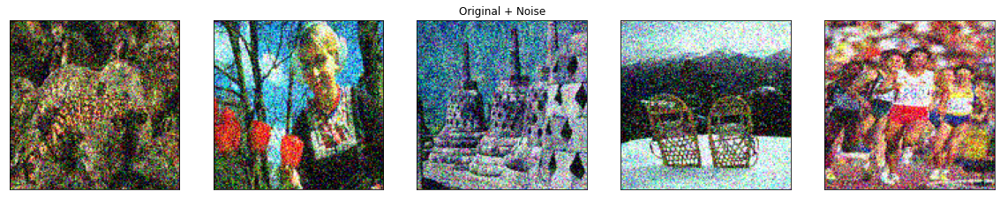

In [ ]:
# load data
dataset, noisy_dataset = get_data()
display_noisy_data(noisy_dataset)

### Configure Model

In [ ]:
# local variables
LATENT_DIM: int = 512


# configure model
class ShallowAutoencoder(Model):
  def __init__(self):
    super().__init__(name='shallow_autoencoder')
    
    self.encoder = Sequential([
      layers.Flatten(),
      layers.Dense(LATENT_DIM, activation='relu', name='code'),
    ], name='encoder')

    self.decoder = Sequential([
      layers.Dense(WIDTH * HEIGHT * COLORS, activation='sigmoid'),
      layers.Reshape((WIDTH, HEIGHT, COLORS))
    ], name='decoder')

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded


# compile model
model = ShallowAutoencoder() 
model.compile(optimizer='adam', loss=losses.MeanSquaredError())

### Train Model

In [ ]:
# train model
train_model(model, dataset, noisy_dataset)

Epoch 1/100
7/7 [==============================] - 1s 51ms/step - loss: 0.0628 - val_loss: 0.0613
Epoch 2/100
7/7 [==============================] - 0s 27ms/step - loss: 0.0588 - val_loss: 0.0562
Epoch 3/100
7/7 [==============================] - 0s 27ms/step - loss: 0.0539 - val_loss: 0.0569
Epoch 4/100
7/7 [==============================] - 0s 32ms/step - loss: 0.0510 - val_loss: 0.0489
Epoch 5/100
7/7 [==============================] - 0s 26ms/step - loss: 0.0458 - val_loss: 0.0471
Epoch 6/100
7/7 [==============================] - 0s 32ms/step - loss: 0.0440 - val_loss: 0.0482
Epoch 7/100
7/7 [==============================] - 0s 25ms/step - loss: 0.0432 - val_loss: 0.0473
Epoch 8/100
7/7 [==============================] - 0s 25ms/step - loss: 0.0416 - val_loss: 0.0472
Epoch 9/100
7/7 [==============================] - 0s 26ms/step - loss: 0.0405 - val_loss: 0.0449
Epoch 10/100
7/7 [==============================] - 0s 25ms/step - loss: 0.0386 - val_loss: 0.0442
Epoch 11/100
7/7 [=

### Display Model Summary

In [ ]:
model.summary()

Model: "shallow_autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Sequential)        (None, 512)               25166336  
                                                                 
 decoder (Sequential)        (None, 128, 128, 3)       25214976  
                                                                 
Total params: 50,381,312
Trainable params: 50,381,312
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 49152)             0         
                                                                 
 code (Dense)                (None, 512)               25166336  
                                                                 
Total params: 25,166,336
Trainable params: 25,166,336
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 49152)             25214976  
                                                                 
 reshape_1 (Reshape)         (None, 128, 128, 3)       0         
                                                                 
Total params: 25,214,976
Trainable params: 25,214,976
Non-trainable params: 0
_________________________________________________________________


### Test Model

In [ ]:
# test model
start = time.time()

encoded_imgs = model.encoder(noisy_dataset.x_test).numpy()
decoded_imgs = model.decoder(encoded_imgs).numpy()

end = time.time()


# display elapsed time
display_duration(start, end)


--------------------------------------------------------------
Duration: 0.0 minutes and 0.0890202522277832 seconds
--------------------------------------------------------------



### Display Results

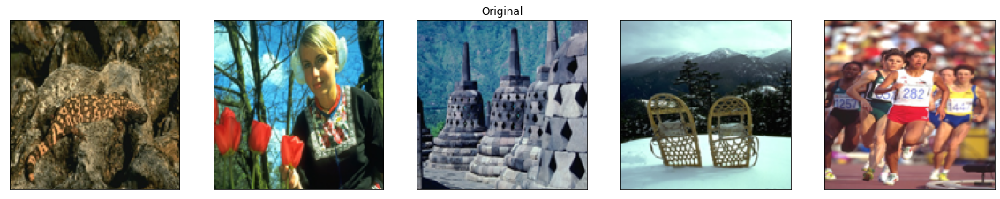

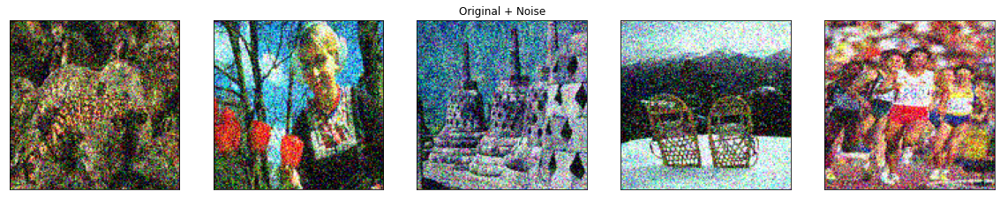

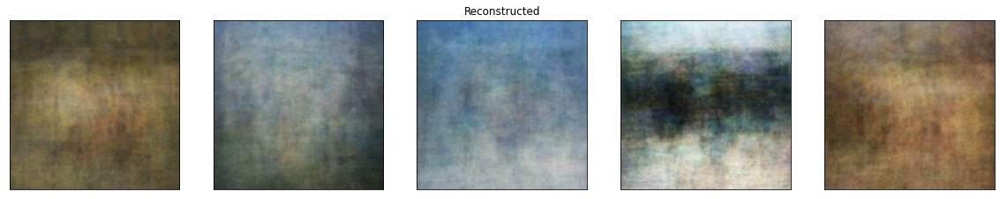

In [ ]:
display_results(dataset, noisy_dataset, decoded_imgs)

## Convolutional Denoising Autoencoder

### Load Data

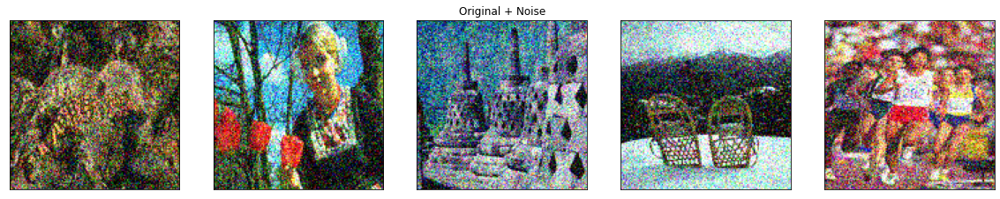

In [ ]:
# load data
dataset, noisy_dataset = get_data()
display_noisy_data(noisy_dataset)

### Configure Model

In [ ]:
# local variables
PADDING: str = 'same'
ACTIVATION: str = 'relu'

KERNEL_SIZE: int = 3
STRIDES: int = 2

LAYER_1: int = 128
LAYER_2: int = 64
LAYER_3: int = 32


# configure model
class ConvolutionalDenoisingAutoencoder(Model):
  def __init__(self):
    super().__init__(name='convolutional_denoising_autoencoder')

    self.encoder = Sequential([
      layers.Input(shape=(WIDTH, HEIGHT, COLORS), name='input'),
      layers.Conv2D(LAYER_1, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_1'),
      layers.Conv2D(LAYER_2, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_2'),
      layers.Conv2D(LAYER_3, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_3'),
    ], name='encoder')

    self.decoder = Sequential([
      layers.Conv2DTranspose(LAYER_3, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_3'),
      layers.Conv2DTranspose(LAYER_2, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_2'),
      layers.Conv2DTranspose(LAYER_1, KERNEL_SIZE, STRIDES, activation=ACTIVATION, padding=PADDING, name='layer_1'),
      layers.Conv2D(COLORS, kernel_size=1, activation='sigmoid', padding=PADDING, name='output')
    ], name='decoder')

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded


# compile model
model = ConvolutionalDenoisingAutoencoder()
model.compile(optimizer='adam', loss=losses.MeanSquaredError())

### Train Model

In [ ]:
# train model
train_model(model, dataset, noisy_dataset)

Epoch 1/100
7/7 [==============================] - 2s 182ms/step - loss: 0.0624 - val_loss: 0.0625
Epoch 2/100
7/7 [==============================] - 1s 120ms/step - loss: 0.0597 - val_loss: 0.0599
Epoch 3/100
7/7 [==============================] - 1s 101ms/step - loss: 0.0566 - val_loss: 0.0567
Epoch 4/100
7/7 [==============================] - 1s 105ms/step - loss: 0.0521 - val_loss: 0.0471
Epoch 5/100
7/7 [==============================] - 1s 101ms/step - loss: 0.0390 - val_loss: 0.0312
Epoch 6/100
7/7 [==============================] - 1s 101ms/step - loss: 0.0279 - val_loss: 0.0272
Epoch 7/100
7/7 [==============================] - 1s 108ms/step - loss: 0.0226 - val_loss: 0.0185
Epoch 8/100
7/7 [==============================] - 1s 101ms/step - loss: 0.0188 - val_loss: 0.0176
Epoch 9/100
7/7 [==============================] - 1s 101ms/step - loss: 0.0168 - val_loss: 0.0147
Epoch 10/100
7/7 [==============================] - 1s 106ms/step - loss: 0.0147 - val_loss: 0.0130
Epoch 11/

### Display Model Summary

In [ ]:
model.summary()

Model: "convolutional_denoising_autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Sequential)        (None, 16, 16, 32)        95840     
                                                                 
 decoder (Sequential)        (None, 128, 128, 3)       101987    
                                                                 
Total params: 197,827
Trainable params: 197,827
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Conv2D)            (None, 64, 64, 128)       3584      
                                                                 
 layer_2 (Conv2D)            (None, 32, 32, 64)        73792     
                                                                 
 layer_3 (Conv2D)            (None, 16, 16, 32)        18464     
                                                                 
Total params: 95,840
Trainable params: 95,840
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_3 (Conv2DTranspose)   (None, 32, 32, 32)        9248      
                                                                 
 layer_2 (Conv2DTranspose)   (None, 64, 64, 64)        18496     
                                                                 
 layer_1 (Conv2DTranspose)   (None, 128, 128, 128)     73856     
                                                                 
 output (Conv2D)             (None, 128, 128, 3)       387       
                                                                 
Total params: 101,987
Trainable params: 101,987
Non-trainable params: 0
_________________________________________________________________


### Test Model

In [ ]:
# test model
start = time.time()

encoded_imgs = model.encoder(noisy_dataset.x_test).numpy()
decoded_imgs = model.decoder(encoded_imgs).numpy()

end = time.time()


# display elapsed time
display_duration(start, end)


--------------------------------------------------------------
Duration: 0.0 minutes and 0.2753791809082031 seconds
--------------------------------------------------------------



### Display Results

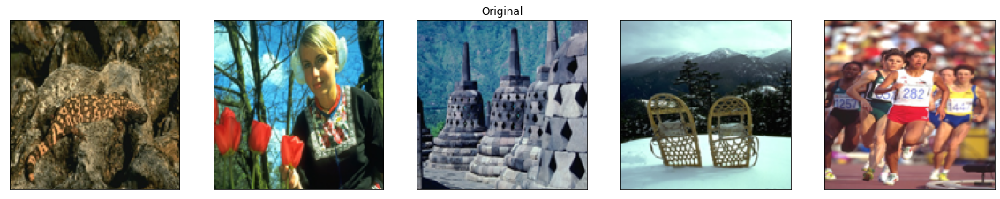

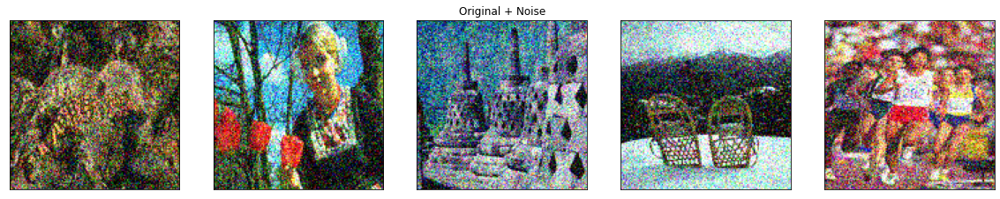

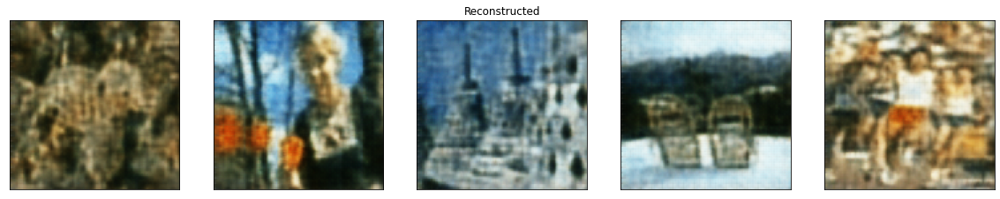

In [ ]:
display_results(dataset, noisy_dataset, decoded_imgs)

## SegNet

Deep Convolutional Autoencoder With No Fully Connected Layer

### Load Data

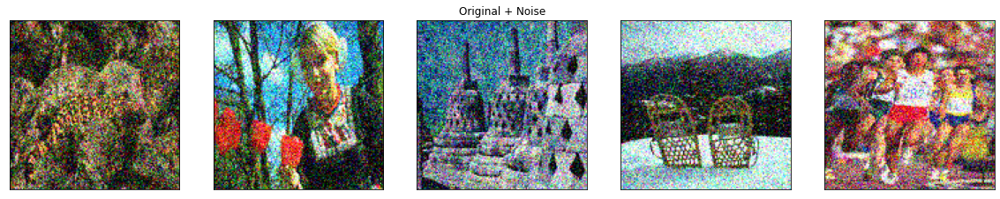

In [ ]:
# load data
dataset, noisy_dataset = get_data()
display_noisy_data(noisy_dataset)

### Configure Model

In [ ]:
# local variables
PADDING: str = 'same'
ACTIVATION: str = 'relu'

KERNEL_SIZE: int = 3
STRIDES: int = 2
POOL_SIZE: int = 2

BLOCK_1: int = 64
BLOCK_2: int = 128
BLOCK_3: int = 256



# layers
class MaxPoolingWithArgmax2D(Layer):
    def __init__(self, name = None, **kwargs):
        super().__init__(name=name, **kwargs)

    def call(self, inputs, **kwargs):
        ksize = [1, POOL_SIZE, POOL_SIZE, 1]
        strides = [1, STRIDES, STRIDES, 1]
        
        output, argmax = tf.nn.max_pool_with_argmax(
            inputs, ksize=ksize, strides=strides, padding='SAME'
        )
        argmax = K.cast(argmax, K.floatx())
        
        return [output, argmax]

    def compute_output_shape(self, input_shape):
        ratio = (1, 2, 2, 1)
        output_shape = [
            dim // ratio[idx] if dim is not None else None
            for idx, dim in enumerate(input_shape)
        ]
        output_shape = Tuple(output_shape)
        return [output_shape, output_shape]

    def compute_mask(self, inputs, mask=None):
        return 2 * [None]

class MaxUnpooling2D(Layer):
    def __init__(self, name = None, **kwargs):
        super().__init__(name=name, **kwargs)

    def call(self, inputs, output_shape=None):
        updates, mask = inputs[0], inputs[1]
        with tf.compat.v1.variable_scope(self.name):
            mask = K.cast(mask, "int32")
            input_shape = tf.shape(updates)
            #  calculation new shape
            if output_shape is None:
                output_shape = (
                    input_shape[0],
                    input_shape[1] * POOL_SIZE,
                    input_shape[2] * POOL_SIZE,
                    input_shape[3],
                )
            self.output_shape1 = output_shape

            # calculation indices for batch, height, width and feature maps
            one_like_mask = K.ones_like(mask, dtype="int32")
            batch_shape = K.concatenate([[input_shape[0]], [1], [1], [1]], axis=0)
            batch_range = K.reshape(
                tf.range(output_shape[0], dtype="int32"), shape=batch_shape
            )
            b = one_like_mask * batch_range
            y = mask // (output_shape[2] * output_shape[3])
            x = (mask // output_shape[3]) % output_shape[2]
            feature_range = tf.range(output_shape[3], dtype="int32")
            f = one_like_mask * feature_range

            # transpose indices & reshape update values to one dimension
            updates_size = tf.size(updates)
            indices = K.transpose(K.reshape(K.stack([b, y, x, f]), [4, updates_size]))
            values = K.reshape(updates, [updates_size])
            ret = tf.scatter_nd(indices, values, output_shape)
            return ret

    def compute_output_shape(self, input_shape):
        mask_shape = input_shape[1]
        return (
            mask_shape[0],
            mask_shape[1] * POOL_SIZE,
            mask_shape[2] * POOL_SIZE,
            mask_shape[3],
        )


# configure model
def segnet():
  # input
  inputs = layers.Input(shape=(WIDTH, HEIGHT, COLORS), name='input')
  
  
  # encoder
  x = layers.Conv2D(BLOCK_1, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_1_layer_1_encoder')(inputs)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2D(BLOCK_1, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_1_layer_2_encoder')(x)
  x = layers.BatchNormalization()(x)
  pool_1, mask_1 = MaxPoolingWithArgmax2D(name='pool_1')(x)
  
  x = layers.Conv2D(BLOCK_2, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_2_layer_3_encoder')(pool_1)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2D(BLOCK_2, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_2_layer_4_encoder')(x)
  x = layers.BatchNormalization()(x)
  pool_2, mask_2 = MaxPoolingWithArgmax2D(name='pool_2')(x)
  
  x = layers.Conv2D(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_5_encoder')(pool_2)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2D(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_6_encoder')(x)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2D(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_7_encoder')(x)
  x = layers.BatchNormalization()(x)
  pool_3, mask_3 = MaxPoolingWithArgmax2D(name='pool_3')(x)
  
  
  # decoder
  unpool_3 = MaxUnpooling2D(name='unpool_3')([pool_3, mask_3])
  x = layers.Conv2DTranspose(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_7_decoder')(unpool_3)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2DTranspose(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_6_decoder')(x)
  x = layers.BatchNormalization()(x)
  x = layers.Conv2DTranspose(BLOCK_3, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_3_layer_5_decoder')(x)
  x = layers.BatchNormalization()(x)
  
  x = layers.Conv2DTranspose(BLOCK_2, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_2_layer_4_decoder')(x)
  x = layers.BatchNormalization()(x)


  unpool_2 = MaxUnpooling2D(name='unpool_2')([x, mask_2])
  x = layers.Conv2DTranspose(BLOCK_2, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_2_layer_3_decoder')(unpool_2)
  x = layers.BatchNormalization()(x)
  
  x = layers.Conv2DTranspose(BLOCK_1, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_1_layer_2_decoder')(x)
  x = layers.BatchNormalization()(x)


  unpool_1 = MaxUnpooling2D(name='unpool_1')([x, mask_1])
  x = layers.Conv2DTranspose(BLOCK_1, KERNEL_SIZE, activation=ACTIVATION, padding=PADDING, name='block_1_layer_1_decoder')(unpool_1)
  x = layers.BatchNormalization()(x)


  # output
  x = layers.Conv2D(COLORS, kernel_size=1, activation=ACTIVATION, padding='valid', name='output')(x)
  x = layers.BatchNormalization()(x)
  x = layers.Reshape((WIDTH, HEIGHT, COLORS), name='reshape')(x)
  outputs = layers.Activation(activation='sigmoid')(x)


  return Model(inputs, outputs, name="SegNet")




# compile model
model = segnet()
model.compile(optimizer='adam', loss=losses.MeanSquaredError())

### Train Model

In [ ]:
# train model
train_model(model, dataset, noisy_dataset)

Epoch 1/100
7/7 [==============================] - 7s 778ms/step - loss: 0.0551 - val_loss: 0.2834
Epoch 2/100
7/7 [==============================] - 5s 676ms/step - loss: 0.0337 - val_loss: 0.3814
Epoch 3/100
7/7 [==============================] - 5s 678ms/step - loss: 0.0276 - val_loss: 0.3759
Epoch 4/100
7/7 [==============================] - 5s 678ms/step - loss: 0.0248 - val_loss: 0.3107
Epoch 5/100
7/7 [==============================] - 5s 677ms/step - loss: 0.0222 - val_loss: 0.2340
Epoch 6/100
7/7 [==============================] - 5s 681ms/step - loss: 0.0207 - val_loss: 0.1424
Epoch 7/100
7/7 [==============================] - 5s 678ms/step - loss: 0.0196 - val_loss: 0.0958
Epoch 8/100
7/7 [==============================] - 5s 685ms/step - loss: 0.0183 - val_loss: 0.0968
Epoch 9/100
7/7 [==============================] - 5s 682ms/step - loss: 0.0177 - val_loss: 0.0771
Epoch 10/100
7/7 [==============================] - 5s 686ms/step - loss: 0.0164 - val_loss: 0.0851
Epoch 11/

### Display Model Summary

In [ ]:
model.summary()

Model: "SegNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 block_1_layer_1_encoder (Conv2  (None, 128, 128, 64  1792       ['input[0][0]']                  
 D)                             )                                                                 
                                                                                                  
 batch_normalization_15 (BatchN  (None, 128, 128, 64  256        ['block_1_layer_1_encoder[0][0]']
 ormalization)                  )                                                            

### Test Model

In [ ]:
# test model
start = time.time()
decoded_imgs = model(noisy_dataset.x_test).numpy()
end = time.time()

# display elapsed time
display_duration(start, end)


--------------------------------------------------------------
Duration: 0.0 minutes and 10.973362684249878 seconds
--------------------------------------------------------------



### Display Results

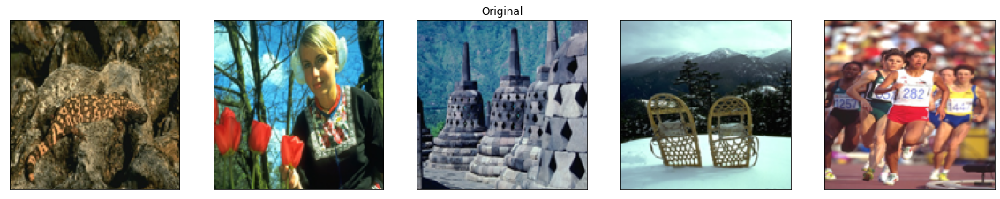

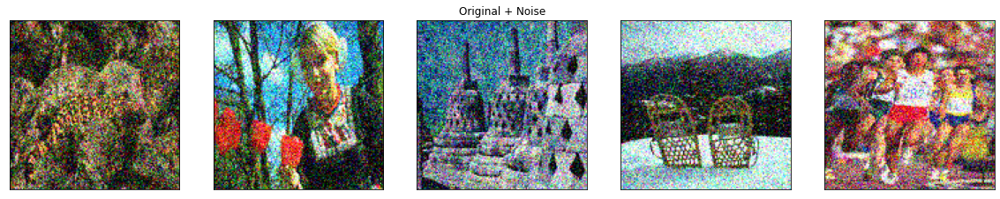

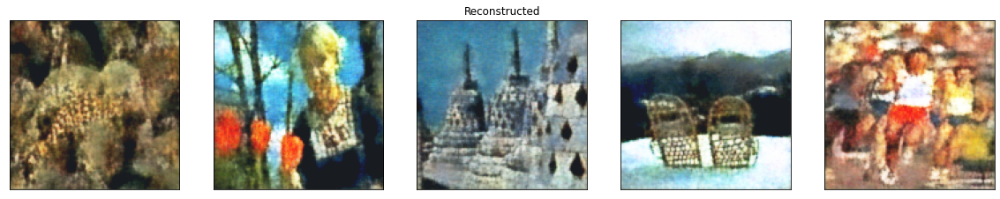

In [ ]:
display_results(dataset, noisy_dataset, decoded_imgs)

## U-Net

Convolutional Network with Max Pooling

### Load Data

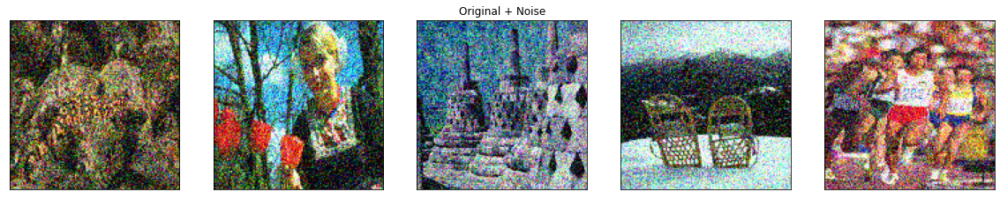

In [ ]:
# load data
dataset, noisy_dataset = get_data()
display_noisy_data(noisy_dataset)

### Configure Model

In [ ]:
# local variables
LAYER_DEPTH: int = 3              # total depth of unet

NUM_FILTERS_ROOT: int = 64        # number of filters in top unet layer 
KERNEL_SIZE: int = 3              # size of convolutional layers
PADDING: str = 'same'             # padding to be used in convolutions
ACTIVATION: str = 'relu'          # activation to be used
POOL_SIZE: int = 2                # size of maxplool layers
STRIDES: int = 1

NUM_BLOCKS: int = 2



# functions
def _get_filter_count(layer_idx: int) -> int:
    return (2 ** layer_idx) * NUM_FILTERS_ROOT


# layers
class ConvBlock(Layer):
  def __init__(self, layer_idx: int, name = None, **kwargs):
    super().__init__(name=name, **kwargs)

    self.layer_idx = layer_idx

    self.convs = []

    num_filters = _get_filter_count(layer_idx)
    for _ in range(NUM_BLOCKS):
      conv = layers.Conv2D(num_filters, KERNEL_SIZE, STRIDES, PADDING, activation=ACTIVATION)
      self.convs.append(conv)

  def call(self, inputs, **kwargs):
    x = inputs
    for conv in self.convs:
      x = conv(x)
    return x

class UpconvBlock(Layer):
  def __init__(self, layer_idx: int, name = None, **kwargs):
    super().__init__(name=name, **kwargs)

    self.layer_idx = layer_idx

    num_filters = _get_filter_count(layer_idx + 1)
    self.upconv = layers.Conv2DTranspose(num_filters // 2,
                                          kernel_size=POOL_SIZE,
                                          strides=POOL_SIZE,
                                          padding=PADDING,
                                          activation=ACTIVATION)

  def call(self, inputs, **kwargs):
    return self.upconv(inputs)

class CropConcatBlock(Layer):
  def __init__(self, name = None, **kwargs):
    super().__init__(name=name, **kwargs)

  def call(self, x, down_layer, **kwargs):
    x1_shape = tf.shape(down_layer)
    x2_shape = tf.shape(x)

    height_diff = (x1_shape[1] - x2_shape[1]) // 2
    width_diff = (x1_shape[2] - x2_shape[2]) // 2

    down_layer_cropped = down_layer[:,
                                    height_diff: (x2_shape[1] + height_diff),
                                    width_diff: (x2_shape[2] + width_diff),
                                    :]

    x = tf.concat([down_layer_cropped, x], axis=-1)
    return x


# configure model
def unet():
  layer_idx = 0
  contracting_layers = []

  # input
  inputs = layers.Input(shape=(WIDTH, HEIGHT, COLORS), name='input')

  # encoder
  x = inputs
  for layer_idx in range(LAYER_DEPTH):
    x = ConvBlock(layer_idx, name=f'conv_{layer_idx + 1}_encoder')(x)
    contracting_layers.append(x)
    x = layers.MaxPooling2D(POOL_SIZE, name=f'pool_{layer_idx + 1}_encoder')(x)

  # code
  x = ConvBlock(layer_idx + 1, name='code')(x)

  # decoder
  for layer_idx in range(layer_idx, -1, -1):
    x = UpconvBlock(layer_idx, name=f'upconv_{layer_idx + 1}_decoder')(x)
    x = CropConcatBlock(name=f'crop_{layer_idx + 1}_decoder')(x, contracting_layers[layer_idx])
    x = ConvBlock(layer_idx, name=f'conv_{layer_idx + 1}_decoder')(x)

  # output
  x = layers.Conv2D(COLORS, kernel_size=1, padding='valid', activation=ACTIVATION, name='output')(x)
  x = layers.BatchNormalization()(x)
  outputs = layers.Activation(activation='sigmoid')(x)
  
  
  return Model(inputs, outputs, name="U-Net")



# compile model
model = unet()
model.compile(optimizer='adam', loss=losses.MeanSquaredError())

### Train Model

In [ ]:
# train model
train_model(model, dataset, noisy_dataset)

Epoch 1/100
7/7 [==============================] - 11s 1s/step - loss: 0.0497 - val_loss: 0.0647
Epoch 2/100
7/7 [==============================] - 2s 335ms/step - loss: 0.0458 - val_loss: 0.0685
Epoch 3/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0452 - val_loss: 0.0685
Epoch 4/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0448 - val_loss: 0.0635
Epoch 5/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0443 - val_loss: 0.0610
Epoch 6/100
7/7 [==============================] - 2s 335ms/step - loss: 0.0442 - val_loss: 0.0623
Epoch 7/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0439 - val_loss: 0.0642
Epoch 8/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0436 - val_loss: 0.0610
Epoch 9/100
7/7 [==============================] - 2s 332ms/step - loss: 0.0436 - val_loss: 0.0576
Epoch 10/100
7/7 [==============================] - 2s 333ms/step - loss: 0.0433 - val_loss: 0.0540
Epoch 11/10

### Display Model Summary

In [ ]:
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_1_encoder (ConvBlock)     (None, 128, 128, 64  38720       ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 pool_1_encoder (MaxPooling2D)  (None, 64, 64, 64)   0           ['conv_1_encoder[0][0]']         
                                                                                              

### Test Model

In [ ]:
# test model
start = time.time()
decoded_imgs = model(noisy_dataset.x_test).numpy()
end = time.time()

# display elapsed time
display_duration(start, end)


--------------------------------------------------------------
Duration: 0.0 minutes and 6.611452102661133 seconds
--------------------------------------------------------------



### Display Results

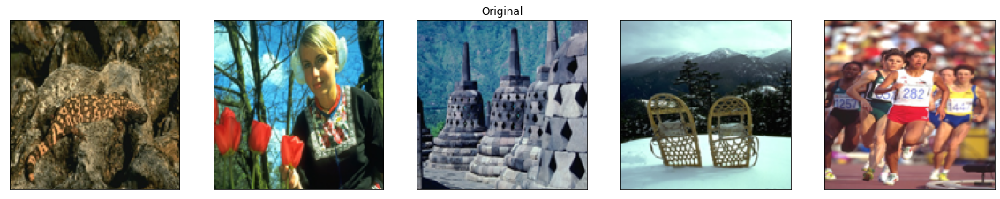

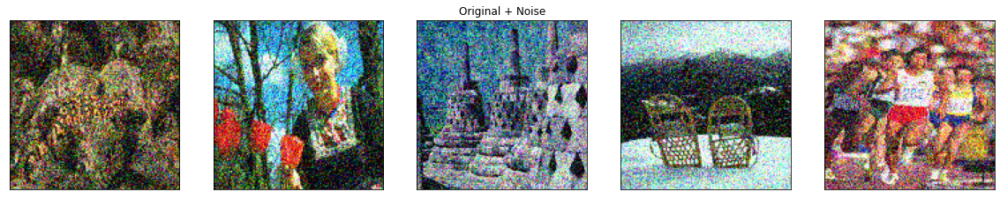

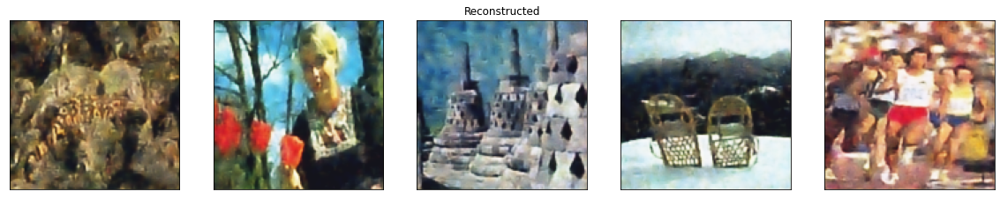

In [ ]:
display_results(dataset, noisy_dataset, decoded_imgs)